# Overview
In this notebook you will find examples of queries for the various datasources in the WIWB API. For more information see the latest version of the manual: (https://publicwiki.deltares.nl/display/FEWSDOC/WIWB), for more examples see the example document (http://85.214.197.176:8080/meteobase/downloads/fixed/literatuur/P951_Voorbeeldverzoeken_WIWB_API.pdf). The purpose of this notebook is to show how to do these queries in python and to check if all the data mentioned is queryable. Additionally,differences between the overlapping datasources (ie. different precipitation measurements) should be examined. Finally, datasources that are not mentioned in the documentation need to be identified and inspected.

The following datasources from the documentation need to be checked:
- [KNMI IRC Realtime](#KNMI-IRC-Realtime) &#9745;
- [KNMI IRC Early Reanalysis](#KNMI-IRC-Early-Reanalysis) &#9745;
- [KNMI IRC Final Reanalysis](#KNMI-IRC-Final-Reanalysis) &#9745;
- [Ongecorrigeerde Radar (Real time)](#Ongecorrigeerde-Radar) &#9745;
- [Radar Corrected B](#Radar-Corrected-B) &#9745;
- [Radar Corrected C2](#Radar-Corrected-C2) &#9745;
- [Radar Corrected D2](#Radar-Corrected-D2) &#9745;
- [Eps meteo parameters](#KNMI-Regional-Eps) &#9745;
- [Hirlam](#Hirlam) &#9745;
- [Harmonie 36](#Harmonie-36) &#9745;
- [Harmonie 40](#Harmonie-40) &#9745;
- Iris stations Ongevalideerd
- Iris stations gevalideerd
- Referentie gasverdamping
- Eps buitenwaterstanden
- [Waarschuwingen scheepvaart kust](#Waarschuwingen-scheepvaart-kust)
- [Waarschuwingen scheepvaart NL](#Waarschuwingen-scheepvaart-NL)
- Weerwaarschuwingen 
- [Waqua](#Waqua)
- KNMI AWS Stations
- [Meteobase Makkink Verdamping](#Meteobase-Makkink-Evaporation)
- [Meteobase Neerslag](#Meteobase-Precipitation)
- [Meteobase Neerslag Pennman Rose](#Meteobase-Pennman-Monteith-Evaporation)
- [SATDATA3.0 Evapotransipration](#SATDATA3.0)
- [SATDATA3.0 Evapotranspiration Reanalysis](#SATDATA3.0-Reanalysis)
- Interim Evapotranspiration dataproduct LHM [SATDATA]

# Results of analysis

For all modelgrid sources such as satdata3.0, the model gives the results of the given day, two days into the future and one day into the past, this is described in `Structuur SATDATA3.0 databronnen.pdf`. In order to get the right data, multiple queries have to be done. The tiff for the given date is the prediction. The re-analysis datasource is the reanalysis of the satdata3.0 based on the now historical data.

In [2]:
# imports 
import requests
import rasterio
from requests.auth import HTTPBasicAuth
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import json
import seaborn as sns
import glob
import os

# general settings
# import credentials, comment and insert your own below.
from credentials import auth

# put in your own credentials
username = ""
password = ""
auth = HTTPBasicAuth(username, password)

## KNMI IRC Realtime
07-12-2018 to now

In [3]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.International.Radar.Composite",
             "Settings": {
                 "StartDate": "20190813160000",
                 "EndDate": "20190815160000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)

In [39]:
# response.content
with open("tiff/knmi_international_radar_composite.zip", "wb") as f:
    f.write(response.content)

In [40]:
!unzip tiff/knmi_international_radar_composite.zip -d knmi_international_radar_composite

Archive:  tiff/knmi_international_radar_composite.zip
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif  
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h05m00s_2019-08-13T16h10m00s.tif  
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h10m00s_2019-08-13T16h15m00s.tif  
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h15m00s_2019-08-13T16h20m00s.tif  
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h20m00s_2019-08-13T16h25m00s.tif  
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h25m00s_2019-08-13T16h30m00s.tif  
  inflating: knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h30m00s_2019-08-13T16h35m00s.tif  
  inflating: kn

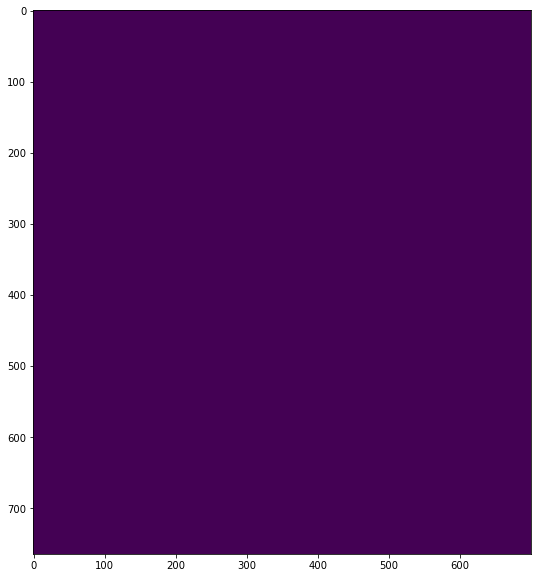

In [70]:
src = rasterio.open('knmi_international_radar_composite/Knmi.International.Radar.Composite_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif')
knmi_international_radar_composite = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(knmi_international_radar_composite)

## KNMI IRC Early Reanalysis
19-07-2019 to now

In [10]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.International.Radar.Composite.Early.Reanalysis",
             "Settings": {
                 "StartDate": "20190813160000",
                 "EndDate": "20190813161000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("KNMI_IRC_Early_Reanalysis.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [11]:
!unzip KNMI_IRC_Early_Reanalysis.zip -d KNMI_IRC_Early_Reanalysis

Archive:  KNMI_IRC_Early_Reanalysis.zip
  inflating: KNMI_IRC_Early_Reanalysis/Knmi.International.Radar.Composite.Early.Reanalysis_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif  
  inflating: KNMI_IRC_Early_Reanalysis/Knmi.International.Radar.Composite.Early.Reanalysis_P_2019-08-13T16h05m00s_2019-08-13T16h10m00s.tif  


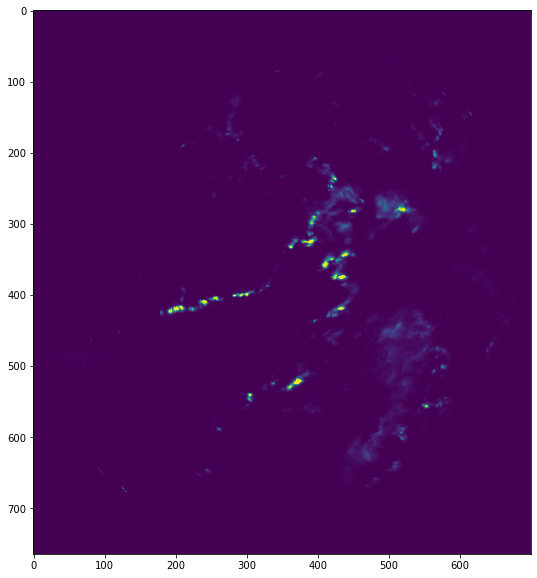

In [12]:
src = rasterio.open('KNMI_IRC_Early_Reanalysis/Knmi.International.Radar.Composite.Early.Reanalysis_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif')
KNMI_IRC_Early_Reanalysis = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(KNMI_IRC_Early_Reanalysis, vmin=0, vmax=1)

## KNMI IRC Final Reanalysis
19-06-2019 to now

In [13]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.International.Radar.Composite.Final.Reanalysis",
             "Settings": {
                 "StartDate": "20190813160000",
                 "EndDate": "20190813161000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("KNMI_IRC_Final_Reanalysis.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [14]:
!unzip KNMI_IRC_Final_Reanalysis.zip -d KNMI_IRC_Final_Reanalysis

Archive:  KNMI_IRC_Final_Reanalysis.zip
  inflating: KNMI_IRC_Final_Reanalysis/Knmi.International.Radar.Composite.Final.Reanalysis_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif  
  inflating: KNMI_IRC_Final_Reanalysis/Knmi.International.Radar.Composite.Final.Reanalysis_P_2019-08-13T16h05m00s_2019-08-13T16h10m00s.tif  


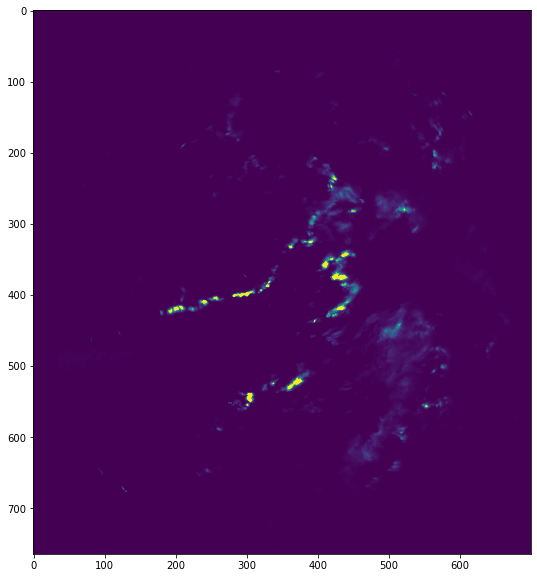

In [15]:
src = rasterio.open('KNMI_IRC_Final_Reanalysis/Knmi.International.Radar.Composite.Final.Reanalysis_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif')
KNMI_IRC_Final_Reanalysis = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(KNMI_IRC_Final_Reanalysis, vmin=0, vmax=1)

## Ongecorrigeerde Radar
01-09-2017 to now

In [16]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.Radar.Uncorrected",
             "Settings": {
                 "StartDate": "20190813160000",
                 "EndDate": "20190813161000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("Knmi_Radar_Uncorrected.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [17]:
!unzip Knmi_Radar_Uncorrected.zip -d Knmi_Radar_Uncorrected

Archive:  Knmi_Radar_Uncorrected.zip
  inflating: Knmi_Radar_Uncorrected/Knmi.Radar.Uncorrected_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif  
  inflating: Knmi_Radar_Uncorrected/Knmi.Radar.Uncorrected_P_2019-08-13T16h05m00s_2019-08-13T16h10m00s.tif  


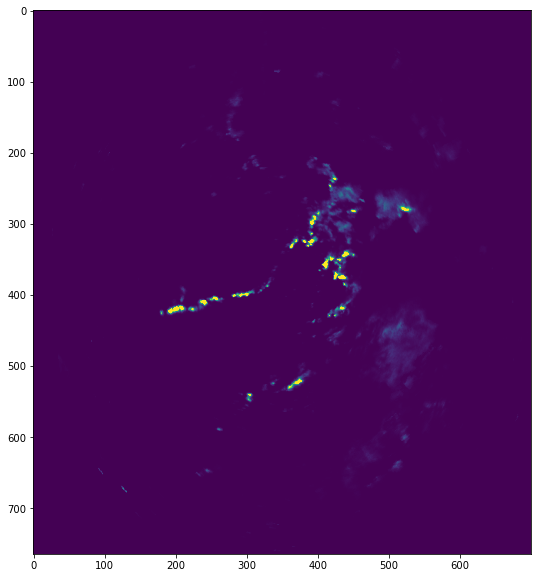

In [18]:
src = rasterio.open('Knmi_Radar_Uncorrected/Knmi.Radar.Uncorrected_P_2019-08-13T16h00m00s_2019-08-13T16h05m00s.tif')
Knmi_Radar_Uncorrected = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(Knmi_Radar_Uncorrected, vmin=0, vmax=1)

## Radar Corrected B
01-09-2017 until 28-08-2018

In [19]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.Radar.CorrectedB",
             "Settings": {
                 "StartDate": "20180613160000",
                 "EndDate": "20180613161000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("Knmi_Radar_CorrectedB.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [20]:
!unzip Knmi_Radar_CorrectedB.zip -d Knmi_Radar_CorrectedB

Archive:  Knmi_Radar_CorrectedB.zip
  inflating: Knmi_Radar_CorrectedB/Knmi.Radar.CorrectedB_P_2018-06-13T16h00m00s_2018-06-13T16h05m00s.tif  
  inflating: Knmi_Radar_CorrectedB/Knmi.Radar.CorrectedB_P_2018-06-13T16h05m00s_2018-06-13T16h10m00s.tif  


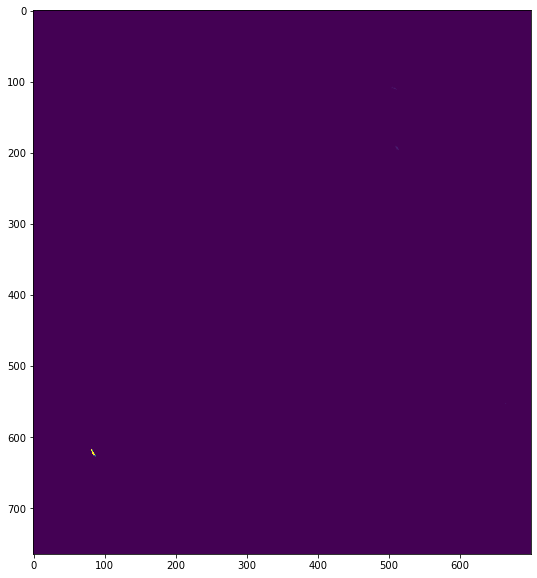

In [21]:
src = rasterio.open('Knmi_Radar_CorrectedB/Knmi.Radar.CorrectedB_P_2018-06-13T16h00m00s_2018-06-13T16h05m00s.tif')
Knmi_Radar_CorrectedB = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(Knmi_Radar_CorrectedB, vmin=0, vmax=1)

# Radar Corrected C2

In [22]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.Radar.CorrectedC2",
             "Settings": {
                 "StartDate": "20180613160000",
                 "EndDate": "20180613161000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("Knmi_Radar_CorrectedC2.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [23]:
!unzip Knmi_Radar_CorrectedC2.zip -d Knmi_Radar_CorrectedC2

Archive:  Knmi_Radar_CorrectedC2.zip
  inflating: Knmi_Radar_CorrectedC2/Knmi.Radar.CorrectedC2_P_2018-06-13T16h00m00s_2018-06-13T16h05m00s.tif  
  inflating: Knmi_Radar_CorrectedC2/Knmi.Radar.CorrectedC2_P_2018-06-13T16h05m00s_2018-06-13T16h10m00s.tif  


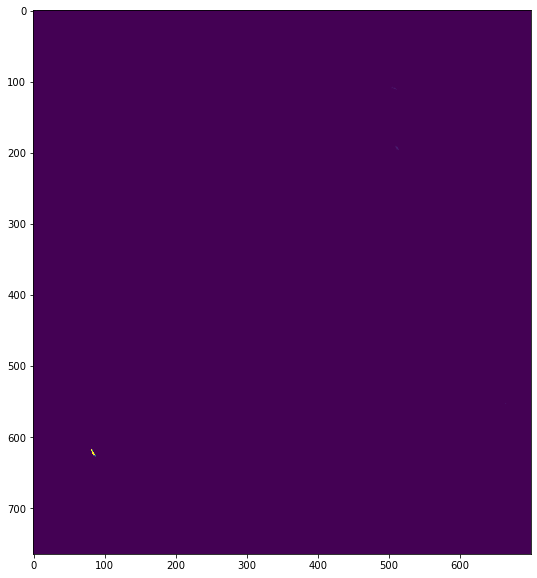

In [24]:
src = rasterio.open('Knmi_Radar_CorrectedC2/Knmi.Radar.CorrectedC2_P_2018-06-13T16h00m00s_2018-06-13T16h05m00s.tif')
Knmi_Radar_CorrectedC2 = src.read(1)
plt.figure(figsize=(10, 10))
plt.imshow(Knmi_Radar_CorrectedC2, vmin=0, vmax=1)

## Radar Corrected D2

In [25]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Knmi.Radar.CorrectedD2",
             "Settings": {
                 "StartDate": "20180613160000",
                 "EndDate": "20180613161000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("Knmi_Radar_CorrectedD2.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [26]:
!unzip Knmi_Radar_CorrectedD2.zip -d Knmi_Radar_CorrectedD2

Archive:  Knmi_Radar_CorrectedD2.zip
  inflating: Knmi_Radar_CorrectedD2/Knmi.Radar.CorrectedD2_P_2018-06-13T16h00m00s_2018-06-13T16h05m00s.tif  
  inflating: Knmi_Radar_CorrectedD2/Knmi.Radar.CorrectedD2_P_2018-06-13T16h05m00s_2018-06-13T16h10m00s.tif  


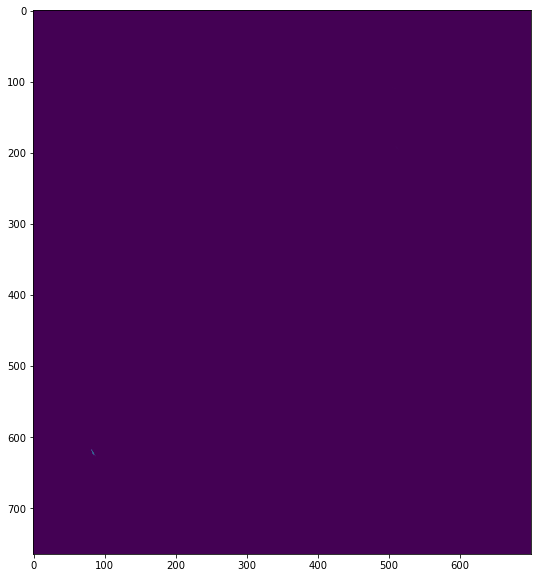

In [27]:
src = rasterio.open('Knmi_Radar_CorrectedD2/Knmi.Radar.CorrectedD2_P_2018-06-13T16h00m00s_2018-06-13T16h05m00s.tif')
Knmi_Radar_CorrectedC2 = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(Knmi_Radar_CorrectedC2)

## KNMI Regional Eps
*notes: couldn't find 'URGD:10m'*

In [28]:
headerjson = {"Accept": "application/json",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
            "DataSourceCode": "Knmi.RegionalEps",
            "Settings": {
                "ModelDate": "20180101000000",
                "VariableCodes": [
                    "P",
                    "TMP",
                    "WindSpeed",
                    "TMAX",
                    "TMIN",
                    "TCDC",
                    "VGRD:10m",
                    # "URGD:10m", ## THIS VARIABLE WAS NOT AVAILABLE
                    "DPT",
                    "SnowDepth",
                    "WindSpeed",
                    "WindDirection"
                ],
                "LocationCodes": [
                    "06260",
                ]
            }
        }
    ],
    "Exporter": {
        "DataFormatCode": "json"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/ensembletimeseries/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

<Response [200]>


In [29]:
with open("Knmi_RegionalEps.json", "w") as f:
    f.write(json.dumps(response.json()))

In [30]:
with open("Knmi_RegionalEps.json", "r") as f:
    dicty = json.loads(f.read())

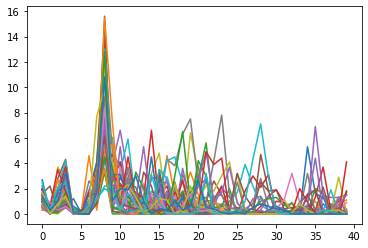

In [31]:
for ensemble in range(1, 52):
    ts = []
    for i in dicty["Data"][0]["Ensembles"][str(ensemble)]["Data"]:
        ts.append(i["Value"])
    plt.plot(ts)

## Knmi.WaterSetupEps
*I'm not getting anything back with the model date that I'm using. have to find the right modeldate*

In [32]:
headerjson = {"Accept": "application/json",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
            "DataSourceCode": "Knmi.Synops",
            "Settings": {
                "ModelDate": "20181201000000",
                "VariableCodes": [
                    "WaterSurge"
                ],
                "LocationCodes": [
                    2333,
                ]
            }
        }
    ],
    "Exporter": {
        "DataFormatCode": "json"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/ensembletimeseries/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)
print(response.text)

<Response [500]>
{"ClientType":"Server","Exception":{"Name":"InvalidOperationException","Message":"Validating Reader with DataSourceCode Knmi.Synops failed.","InnerException":{"Name":"ArgumentNullException","Message":"Value cannot be null.\r\nParameter name: DataSourceSettings.Ensemble"}},"RequestId":70565894}


In [33]:
with open("Knmi_WaterSetupEps.json", "w") as f:
    f.write(json.dumps(response.json()))

# Hirlam
http://projects.knmi.nl/datacentrum/catalogus/catalogus/content/nl-nwp-lam-grid-p1.htm

In [36]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
    {
        "DataSourceCode": "Knmi.Hirlam",
        "Settings": {
            "ModelDate": "20200606000000",
            "StartDate": "20200606000000",
            "EndDate": "20200608000000",
            "VariableCodes": ["APCP", "TMP", "TCDC", "UGRD:10m", "VGRD:10m", "DPT", "LowCloudCover", "MediumCloudCover", "HighCloudCover", "LargeScaleP", "WaterEqSnowDepth", "GlobalRadFlux", "NetSwRadFlux", "NetLwRadFlux", "SensHeatFlux", "AirPressure", "LatHeatFlux"]
        }
    }],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/modelgrids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("hirlam.zip", "wb") as f:
    f.write(response.content)

<Response [500]>


In [39]:
response.content

b'{"ClientType":"Server","Exception":{"Name":"InvalidOperationException","Message":"Executing Reader with DataSourceCode Knmi.Hirlam failed.","InnerException":{"Name":"InvalidOperationException","Message":"Data with unit w/m2 cannot be converted to unit j/m2"}},"RequestId":70565938}'

In [37]:
!unzip hirlam.zip -d hirlam

Archive:  hirlam.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of hirlam.zip or
        hirlam.zip.zip, and cannot find hirlam.zip.ZIP, period.


In [72]:
hirlam_files = glob.glob("hirlam/*.tif")
hirlam_dict = {f.split(".")[4]:f for f in hirlam_files}
hirlam_dict

{'1': 'hirlam/Knmi.Hirlam_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '11': 'hirlam/Knmi.Hirlam_99.0.1.11.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '111': 'hirlam/Knmi.Hirlam_99.0.1.111.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '112': 'hirlam/Knmi.Hirlam_99.0.1.112.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '117': 'hirlam/Knmi.Hirlam_99.0.1.117.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '121': 'hirlam/Knmi.Hirlam_99.0.1.121.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '122': 'hirlam/Knmi.Hirlam_99.0.1.122.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '17': 'hirlam/Knmi.Hirlam_99.0.1.17.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '33': 'hirlam/Knmi.Hirlam_99.0.1.33.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '

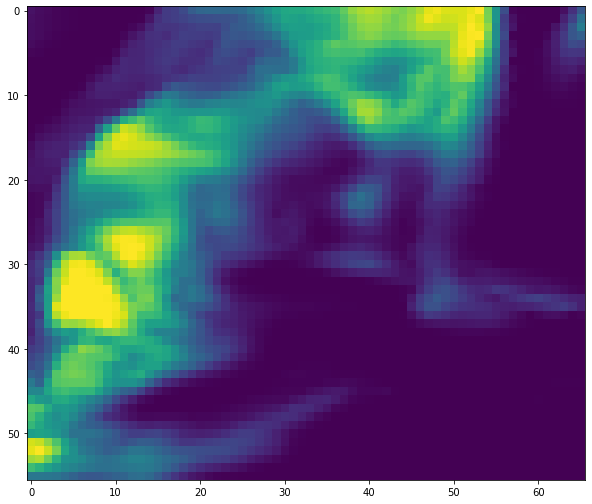

In [91]:
src = rasterio.open(hirlam_dict['74'])
# src = rasterio.open('hirlam/Knmi.Hirlam_99.0.1.11.105_2017-11-12T06h00m00s_2017-11-12T08h00m00s_2017-11-12T09h00m00s.tif')
hirlam = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(hirlam)

# Harmonie 40
http://projects.knmi.nl/datacentrum/catalogus/catalogus/content/nl-nwp-harm40-grid-p1.html

could not request: "LargeScaleP", "WaterEqSnowDepth", "NetSwRadFlux", "NetLwRadFlux", "SensHeatFlux", "LatHeatFlux"

In [43]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
    {
        "DataSourceCode": "Knmi.Harmonie",
        "Settings": {
            "ModelDate": "20200606000000",
            "StartDate": "20200606000000",
            "EndDate": "20200608000000",
            "VariableCodes": ["APCP", "TMP", "TCDC", "UGRD:10m", "VGRD:10m", "LowCloudCover", "MediumCloudCover", "GlobalRad", "AirPressure"]
        }
    }],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/modelgrids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("harmonie.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [44]:
!unzip harmonie.zip -d harmonie

Archive:  harmonie.zip
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T00h00m00s_2020-06-06T01h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T01h00m00s_2020-06-06T02h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T02h00m00s_2020-06-06T03h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T03h00m00s_2020-06-06T04h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T04h00m00s_2020-06-06T05h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T05h00m00s_2020-06-06T06h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T06h00m00s_2020-06-06T07h00m00s.tif  
  inflating: harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-06T07h00m00s_2020-06-06T08h00m00s.tif  
  inflating: harm

In [45]:
harmonie_files = glob.glob("harmonie/*.tif")
harmonie_dict = {f.split(".")[4]:f for f in harmonie_files}
harmonie_dict

{'117': 'harmonie/Knmi.Harmonie_99.0.253.117.105_2020-06-06T00h00m00s_2020-06-07T13h00m00s_2020-06-07T14h00m00s.tif',
 '74': 'harmonie/Knmi.Harmonie_99.0.253.74.105_2020-06-06T00h00m00s_2020-06-07T08h00m00s_2020-06-07T09h00m00s.tif',
 '1': 'harmonie/Knmi.Harmonie_99.0.253.1.103_2020-06-06T00h00m00s_2020-06-07T17h00m00s_2020-06-07T18h00m00s.tif',
 '71': 'harmonie/Knmi.Harmonie_99.0.253.71.105_2020-06-06T00h00m00s_2020-06-06T17h00m00s_2020-06-06T18h00m00s.tif',
 '34': 'harmonie/Knmi.Harmonie_99.0.253.34.105.10_2020-06-06T00h00m00s_2020-06-07T01h00m00s_2020-06-07T02h00m00s.tif',
 '181': 'harmonie/Knmi.Harmonie_99.0.253.181.105_2020-06-06T00h00m00s_2020-06-07T04h00m00s_2020-06-07T05h00m00s.tif',
 '33': 'harmonie/Knmi.Harmonie_99.0.253.33.105.10_2020-06-06T00h00m00s_2020-06-07T17h00m00s_2020-06-07T18h00m00s.tif',
 '11': 'harmonie/Knmi.Harmonie_99.0.253.11.105.2_2020-06-06T00h00m00s_2020-06-07T13h00m00s_2020-06-07T14h00m00s.tif',
 '73': 'harmonie/Knmi.Harmonie_99.0.253.73.105_2020-06-06T00h0

(300, 300)


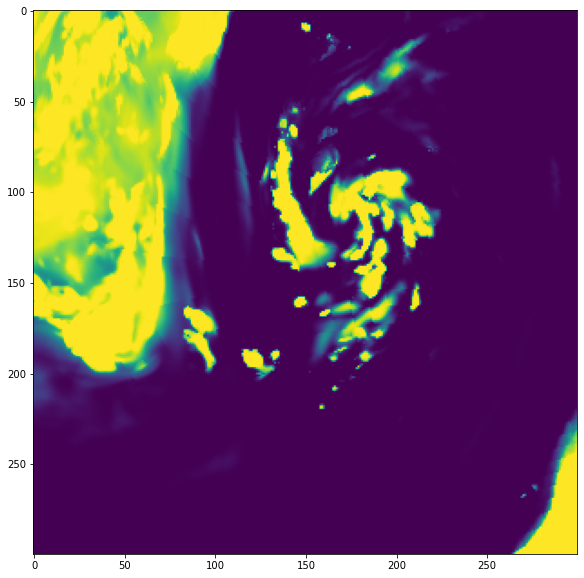

In [46]:
src = rasterio.open(harmonie_dict['74'])
# src = rasterio.open('hirlam/Knmi.Hirlam_99.0.1.11.105_2017-11-12T06h00m00s_2017-11-12T08h00m00s_2017-11-12T09h00m00s.tif')
harmonie = src.read(1)
print(harmonie.shape)
plt.figure(figsize=(10,10))
plt.imshow(harmonie)

# Harmonie 36
http://projects.knmi.nl/datacentrum/catalogus/catalogus/content/nl-nwp-harm-grid-p1.htm

could not request: "LargeScaleP", "WaterEqSnowDepth", "NetSwRadFlux", "NetLwRadFlux", "SensHeatFlux", "LatHeatFlux", "GlobalRad"

In [258]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
    {
        "DataSourceCode": "Knmi.Harmonie.36",
        "Settings": {
            "ModelDate": "20200606000000",
            "StartDate": "20200606000000",
            "EndDate": "20200608000000",
            "VariableCodes": ["APCP", "TMP", "TCDC", "UGRD:10m", "VGRD:10m", "LowCloudCover", "MediumCloudCover", "HighCloudCover", "AirPressure"]
        }
    }],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/modelgrids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("harmonie36.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [259]:
!unzip harmonie36.zip -d harmonie36

Archive:  harmonie36.zip
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T00h00m00s_2020-06-06T01h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T01h00m00s_2020-06-06T02h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T02h00m00s_2020-06-06T03h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T03h00m00s_2020-06-06T04h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T04h00m00s_2020-06-06T05h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T05h00m00s_2020-06-06T06h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T06h00m00s_2020-06-06T07h00m00s.tif  
  inflating: harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-06T07h00m00s_2020-06-06T08h00m0

In [261]:
harmonie36_files = glob.glob("harmonie36/*.tif")
harmonie36_dict = {f.split(".")[5]:f for f in harmonie36_files}
harmonie36_dict

{'1': 'harmonie36/Knmi.Harmonie.36_99.0.1.1.103_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '11': 'harmonie36/Knmi.Harmonie.36_99.0.1.11.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '33': 'harmonie36/Knmi.Harmonie.36_99.0.1.33.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '34': 'harmonie36/Knmi.Harmonie.36_99.0.1.34.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '61': 'harmonie36/Knmi.Harmonie.36_99.0.1.61.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '71': 'harmonie36/Knmi.Harmonie.36_99.0.1.71.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '73': 'harmonie36/Knmi.Harmonie.36_99.0.1.73.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '74': 'harmonie36/Knmi.Harmonie.36_99.0.1.74.105_2020-06-06T00h00m00s_2020-06-07T23h00m00s_2020-06-08T00h00m00s.tif',
 '75': 'harmonie36/Knmi.Harmonie.36_99.0.1.75.105_

In [272]:
for f in harmonie36_files:
    src = rasterio.open(f)
    unique = len(np.unique(src.read(1)))
    if unique > 1:
        print(f"{unique} unique values in {f}")
print("finished")

finished


(300, 300)


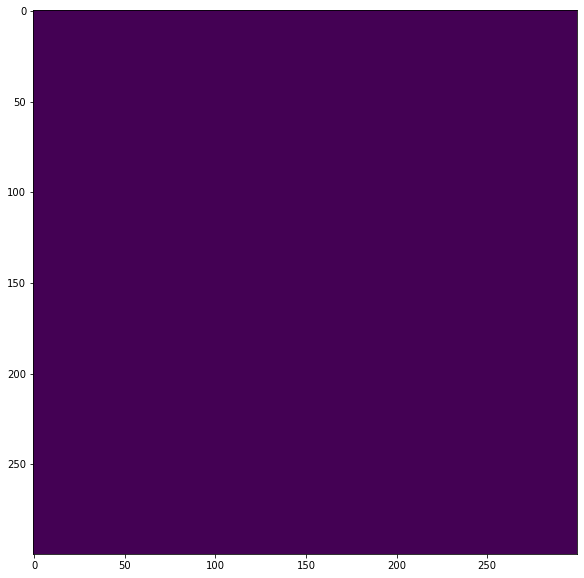

In [273]:
src = rasterio.open(harmonie36_dict['11'])
# src = rasterio.open('hirlam/Knmi.Hirlam_99.0.1.11.105_2017-11-12T06h00m00s_2017-11-12T08h00m00s_2017-11-12T09h00m00s.tif')
harmonie36 = src.read(1)
print(harmonie36.shape)
plt.figure(figsize=(10,10))
plt.imshow(harmonie36)

# SATDATA3.0

In [86]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Satdata.Evapotranspiration",
             "Settings": {
                 "StartDate": "20200713000000",
                 "EndDate": "20200716000000",
                 "ModelDate": "20200713000000",
                 "VariableCodes": ["EvapotranspirationActual", "EvapotranspirationShortage", "QualityFlag", "Uncertainty"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/modelgrids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

response.content
with open("satdata3_0.zip", "wb") as f:
    f.write(response.content)

<Response [200]>


In [87]:
!unzip satdata3_0.zip -d satdata3_0

Archive:  satdata3_0.zip
  inflating: satdata3_0/Satdata.Evapotranspiration_ea_2020-07-13T00h00m00s_2020-07-13T00h00m00s_2020-07-14T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_ea_2020-07-13T00h00m00s_2020-07-14T00h00m00s_2020-07-15T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_ea_2020-07-13T00h00m00s_2020-07-15T00h00m00s_2020-07-16T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_es_2020-07-13T00h00m00s_2020-07-13T00h00m00s_2020-07-14T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_es_2020-07-13T00h00m00s_2020-07-14T00h00m00s_2020-07-15T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_es_2020-07-13T00h00m00s_2020-07-15T00h00m00s_2020-07-16T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_qf_2020-07-13T00h00m00s_2020-07-13T00h00m00s_2020-07-14T00h00m00s.tif  
  inflating: satdata3_0/Satdata.Evapotranspiration_qf_2020-07-13T00h00m00s_2020-07-14T00h00m00s_2020-07-15T00h00m0

(3624, 3145)


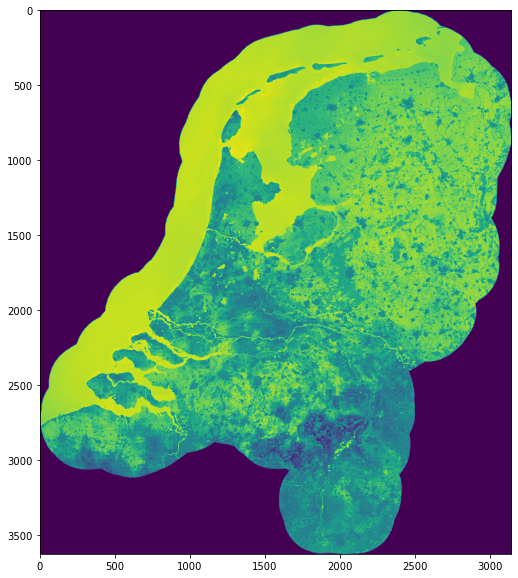

In [89]:
filepaths_es = glob.glob("satdata3_0/Satdata.Evapotranspiration_ea_*.tif")

src = rasterio.open(filepaths_es[0])
satdata = src.read(1)
print(satdata.shape)
plt.figure(figsize=(10,10))
satdata[satdata < 0] = 0
plt.imshow(satdata)

# SATDATA3.0 full month

In [116]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

for date in range(1, 29):
    enddate = date + 3
    if date < 10:
        date = f"0{date}"
    if enddate < 10:
        enddate = f"0{enddate}"

    print(f"processing date: {date}")
    
    # it looks like 
    bodyjson = {
        "Readers": [
            {
                 "DataSourceCode": "Satdata.Evapotranspiration",
                 "Settings": {
                     "StartDate": f"202007{date}000000",
                     "EndDate": f"202007{enddate}000000",
                     "ModelDate": f"202007{date}000000",
                     "VariableCodes": ["EvapotranspirationActual"]
                    }
            }
        ],
        "Exporter": {
            "DataFormatCode": "geotiff"
        }
    }
    
    response = requests.post("https://wiwb.hydronet.com/api/modelgrids/get", auth=auth, headers=headerjson, json=bodyjson)
    
    with open(f"satdata3_0_{date}.zip", "wb") as f:
        f.write(response.content)
    
    with zipfile.ZipFile(f"satdata3_0_{date}.zip", 'r') as zip_ref:
        zip_ref.extractall("satdata3_0_month")
    
    os.remove(f"satdata3_0_{date}.zip")

processing date: 01


2020-07-01
2020-07-02
2020-07-03
2020-07-04
2020-07-05
2020-07-06
2020-07-07
2020-07-08
2020-07-09
2020-07-10
2020-07-11
2020-07-12
2020-07-13
2020-07-14
2020-07-15
2020-07-16
2020-07-17
2020-07-18
2020-07-19
2020-07-20
2020-07-21


<ipython-input-103-b6db46d99fa6>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = pyplot.subplots(figsize=(10,10))


2020-07-22
2020-07-23
2020-07-24
2020-07-25
2020-07-26
2020-07-27
2020-07-28


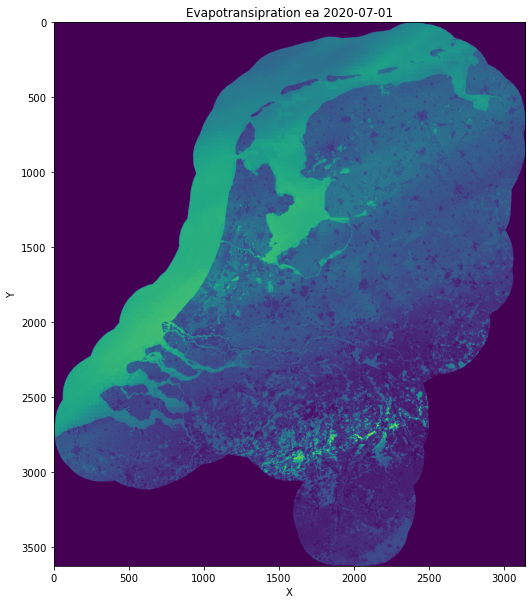

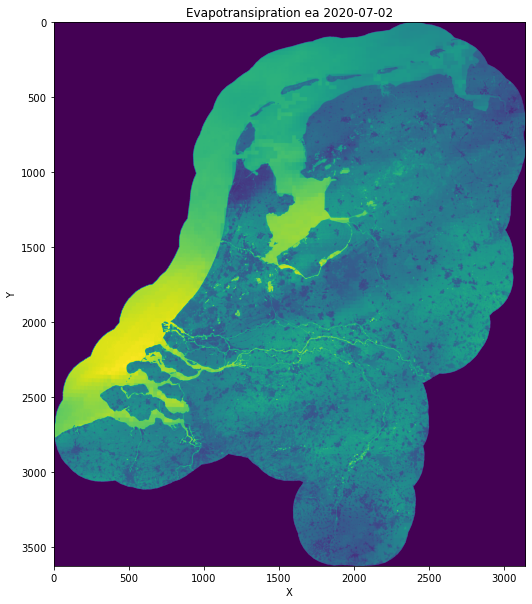

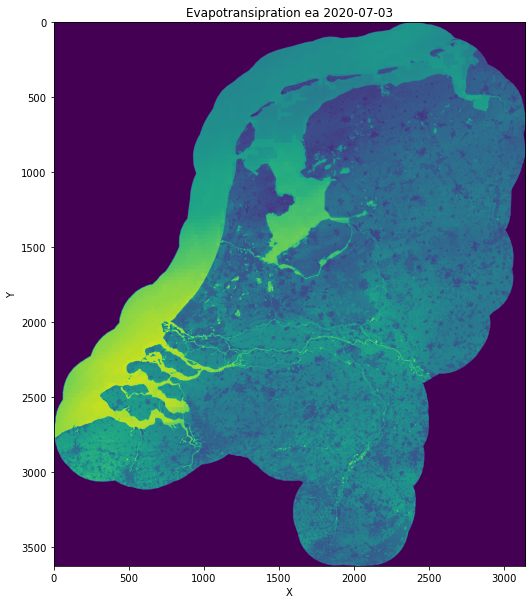

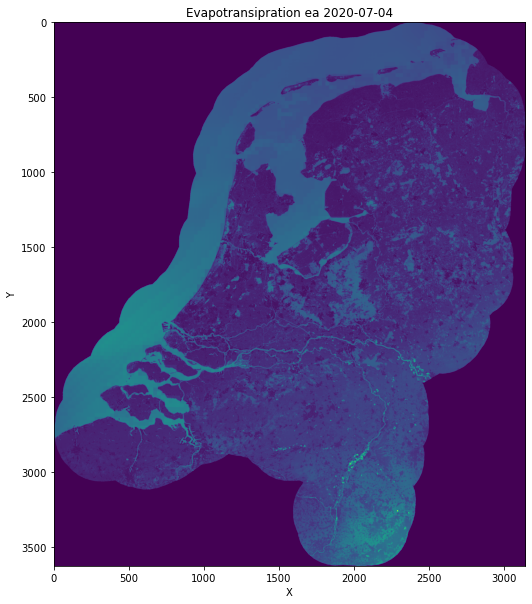

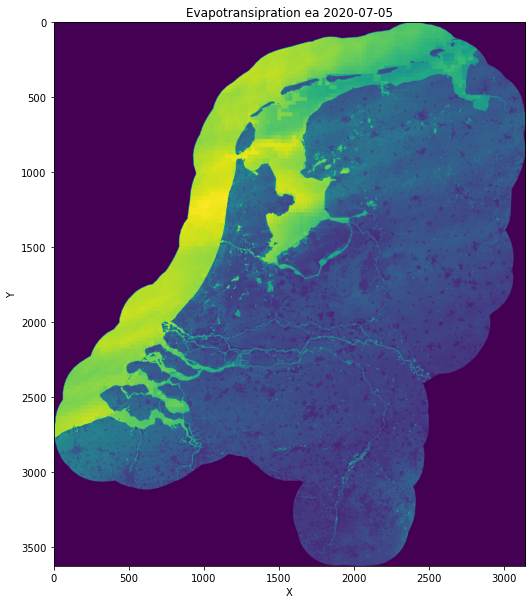

...

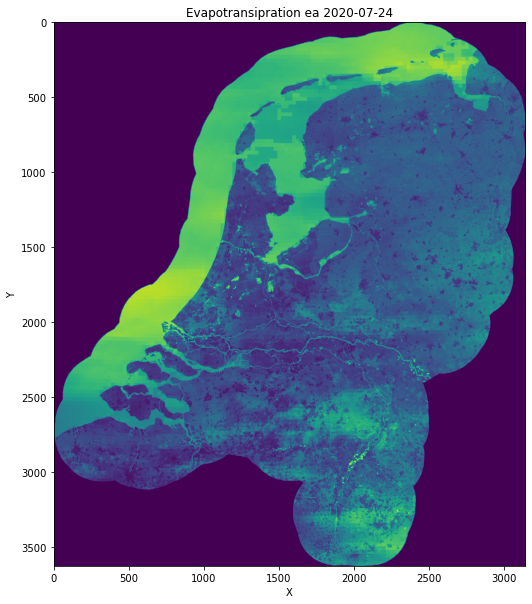

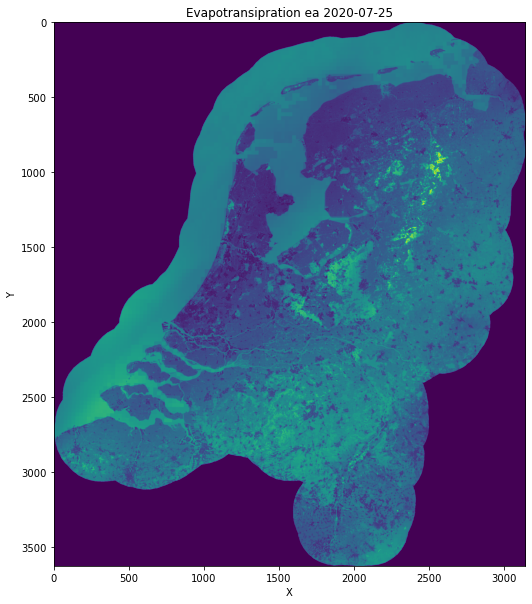

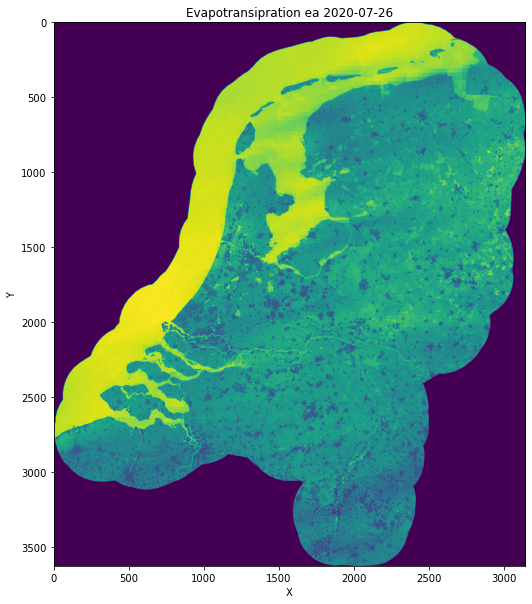

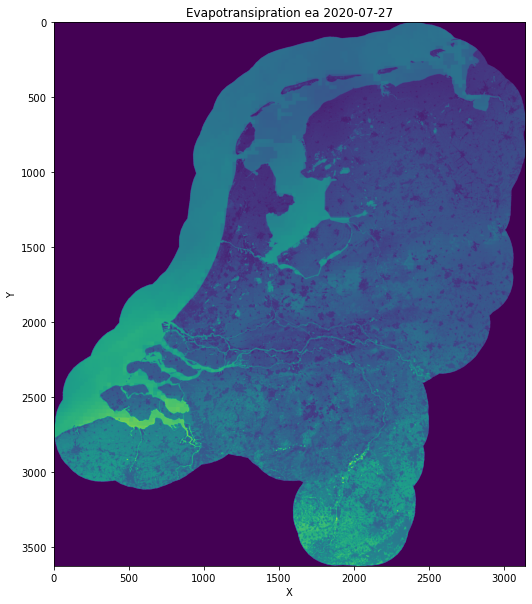

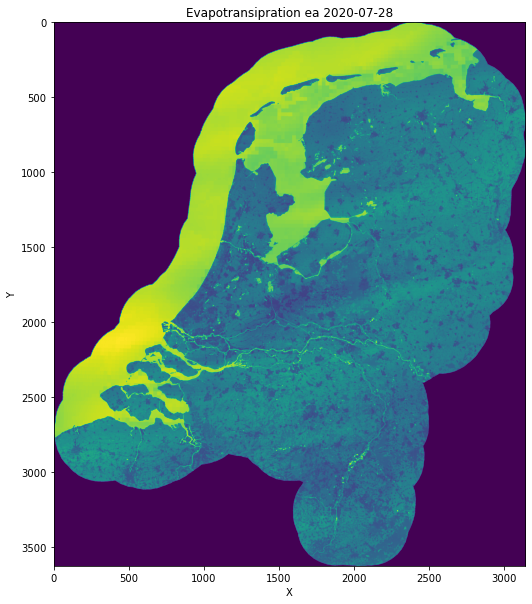

In [103]:
# animation
import imageio
import os

month_satdata30_files = glob.glob(f"satdata3_0_month/*.tif")

# filter only the tiffs that were made on the day of the model, to get the most accurate prediction for each day
filtered_month_satdata30_files = [f for f in month_satdata30_files if f.split("T")[0].split("_")[-1] == f.split("T")[1].split("_")[-1]]


def plot_frame(data, date):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(data)
    ax.set(xlabel='X', ylabel='Y',
           title=f'Evapotransipration ea {date}')
    fig.canvas.draw() 
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    return image
    
images = []
for fp in filtered_month_satdata30_files:
    date = fp.split("T")[1].split("_")[1]
    print(date)
    src = rasterio.open(fp)
    satdata = src.read(1)
    satdata[satdata < 0] = 0
    image = plot_frame(satdata, date)
    images.append(image)
    
imageio.mimsave('./satdata3_0_month_es.gif', [img for img in images], fps=1)

# SATDATA3.0 Reanalysis

In [ ]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

for date in range(1, 29):
    enddate = date + 1
    if date < 10:
        date = f"0{date}"
    if enddate < 10:
        enddate = f"0{enddate}"

    print(f"processing date: {date}")
    
    # it looks like 
    bodyjson = {
        "Readers": [
            {
                 "DataSourceCode": "Satdata.Evapotranspiration.Reanalysis",
                 "Settings": {
                     "StartDate": f"202007{date}000000",
                     "ModelDate": f"202007{date}000000",
                     "EndDate": f"202007{enddate}000000",
                     "VariableCodes": ["EvapotranspirationActual"]
                }
            }
        ],
        "Exporter": {
            "DataFormatCode": "geotiff"
        }
    }
    print(f"doing query for {date}")
    response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
    print("writing response")
    with open(f"satdata3_0_reanalysis_{date}.zip", "wb") as f:
        f.write(response.content)
            
    try:
        with zipfile.ZipFile(f"satdata3_0_reanalysis_{date}.zip", 'r') as zip_ref:
            zip_ref.extractall("satdata3_0_reanalysis_month")
    except:
        print("exception!")
        print(response.text)

    print("removing zip")
    os.remove(f"satdata3_0_reanalysis_{date}.zip")

In [52]:
response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)

In [ ]:
!unzip satdata3_0_reanalysis.zip -d satdata3_0_reanalysis

In [ ]:
satdata3_0_reanalysis_files = glob.glob("satdata3_0_reanalysis/*.tif")
satdata3_0_reanalysis_dict = {f.split(".")[5]:f for f in satdata3_0_reanalysis_files}
satdata3_0_reanalysis_dict

In [ ]:
day = 17
src = rasterio.open(f"satdata3_0_4/Satdata.Evapotranspiration_ea_2020-07-13T00h00m00s_2020-07-{day}T00h00m00s_2020-07-{day+1}T00h00m00s.tif")
# src = rasterio.open('hirlam/Knmi.Hirlam_99.0.1.11.105_2017-11-12T06h00m00s_2017-11-12T08h00m00s_2017-11-12T09h00m00s.tif')
satdata = src.read(1)
print(satdata.shape)
plt.figure(figsize=(10,10))
satdata[satdata < 0] = 0
plt.imshow(satdata)


In [ ]:
# animation
import imageio
import os

def plot_frame(data, date):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(data)
    ax.set(xlabel='X', ylabel='Y',
           title=f'Evapotransipration ea {date}')
    fig.canvas.draw() 
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    return image
    
filepaths = glob.glob("satdata3_0/Satdata.Evapotranspiration_es_*.tif")
images = []
for fp in filepaths:
    date = fp.split("T")[1].split("_")[1]
    src = rasterio.open(fp)
    satdata = src.read(1)
    satdata[satdata < 0] = 0
    image = plot_frame(satdata, date)
    images.append(image)
    
imageio.mimsave('./satdata3_0_es.gif', [img for img in images], fps=1)


In [42]:
listy = glob.glob("satdata3_0/Satdata.Evapotranspiration_ea_*.tif")
listy[0].split("T")[1].split("_")[1]

'2020-07-01'

# Waqua

available from 03-12-2017 until now

In [94]:
headerjson = {"Accept": "application/json",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [{
        "DataSourceCode": "Knmi.WaquaTs",
        "Settings": {
            "ModelDate": "20171220000000",
            "VariableCodes": ["AstronomicalTide", "WaquaTs.Obs", "WaterSurge", "TotalWaterLevel"],
            "LocationCodes": ["delfzijl", "harlinge", "vlissing"]
        }
    }],
    "Exporter": {
    "DataFormatCode": "json"
    }
}


response = requests.post("https://wiwb.hydronet.com/api/modeltimeseries/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)
# print(response.text)

<Response [200]>


In [95]:
with open("Knmi_WaquaTs.json", "w") as f:
    f.write(json.dumps(response.json()))

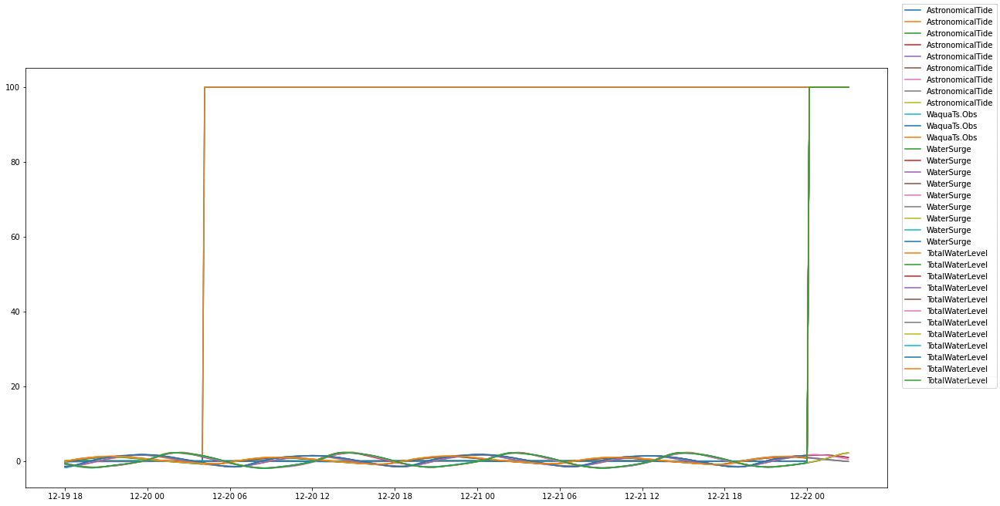

In [97]:
# timeseries 9,10,11 are 99.99 earlier

import json
with open("Knmi_WaquaTs.json") as f:
    data = json.load(f)
    
fig = plt.figure(figsize=(20,10))

for i in range(len(data['Data'])):
    values = []
    datetimes = []
    ensemble_id = i
    variable_name = data["Data"][ensemble_id]["VariableCode"]
    
    for entry in data["Data"][ensemble_id]["Data"]:
        values.append(entry['Value'])
        datetimes.append(pd.Timestamp(entry['DateTime']))
        
    df = pd.DataFrame(values, index=datetimes)
    
    line, = plt.plot(df)
    line.set_label(variable_name)
    fig.legend()
    


# Meteobase Makkink Evaporation

01-01-1985 until 01-01-2019

In [101]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Meteobase.Evaporation.Makkink",
             "Settings": {
                 "StartDate": "19850101000000",
                 "EndDate": "19850103000000",
                 "VariableCodes": ["Evaporation"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("meteobase_evapo_makkink.zip", "wb") as f:
    f.write(response.content)

with zipfile.ZipFile(f"meteobase_evapo_makkink.zip", 'r') as zip_ref:
    zip_ref.extractall("meteobase_evapo_makkink")

<Response [200]>


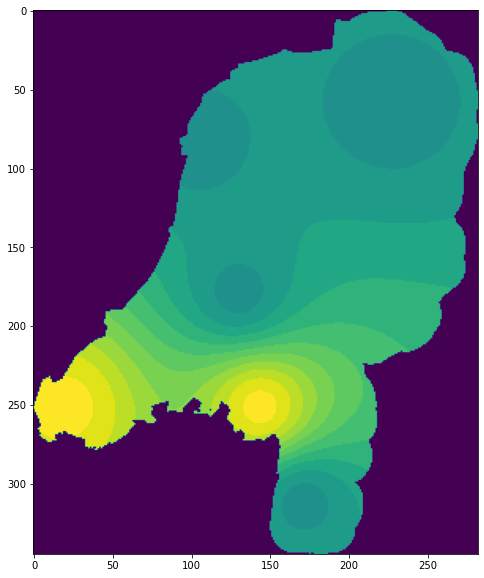

In [102]:
meteobase_evapo_makkink_filepaths = glob.glob("meteobase_evapo_makkink/*.tif")
src = rasterio.open(meteobase_evapo_makkink_filepaths[0])
meteobase_evapo_makkink = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(meteobase_evapo_makkink)

# Meteobase Pennman-Monteith Evaporation

In [152]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Meteobase.Evaporation.PennmanMonteith",
             "Settings": {
                 "StartDate": "20190813000000",
                 "EndDate": "20190820000000",
                 "VariableCodes": ["Evaporation"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("meteobase_evapo_pennman.zip", "wb") as f:
    f.write(response.content)

with zipfile.ZipFile(f"meteobase_evapo_pennman.zip", 'r') as zip_ref:
    zip_ref.extractall("meteobase_evapo_pennman")

<Response [200]>


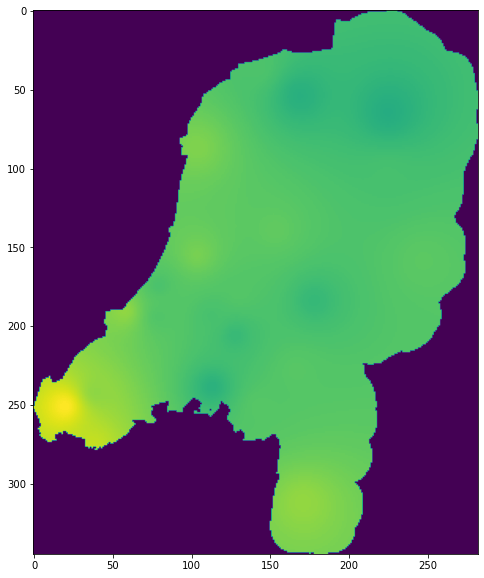

In [157]:
meteobase_evapo_pennman_filepaths = glob.glob("meteobase_evapo_pennman/*.tif")
src = rasterio.open(meteobase_evapo_pennman_filepaths[0])
meteobase_evapo_pennman = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(meteobase_evapo_pennman)

# Meteobase Precipitation

01-01-1985 until 01-01-2019

In [183]:
headerjson = {"Accept": "image/tiff",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
        {
             "DataSourceCode": "Meteobase.Precipitation",
             "Settings": {
                 "StartDate": "20180613000000",
                 "EndDate": "20180620000000",
                 "VariableCodes": ["P"]
                }
        }
    ],
    "Exporter": {
        "DataFormatCode": "geotiff"
    }
}

response = requests.post("https://wiwb.hydronet.com/api/grids/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

# response.content
with open("meteobase_precipitation.zip", "wb") as f:
    f.write(response.content)

with zipfile.ZipFile(f"meteobase_precipitation.zip", 'r') as zip_ref:
    zip_ref.extractall("meteobase_precipitation")

<Response [200]>


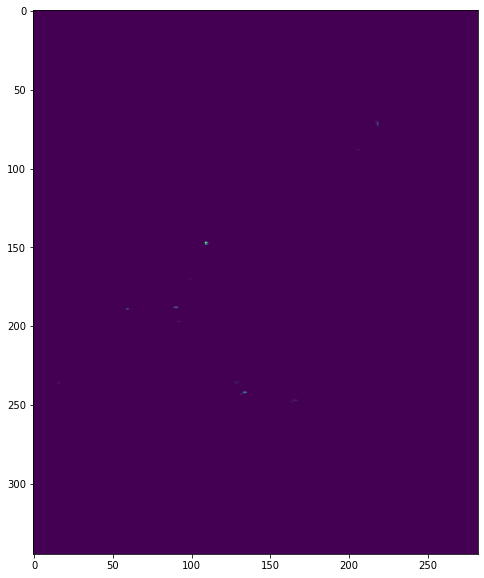

In [203]:
meteobase_precipitation_filepaths = glob.glob("meteobase_precipitation/*.tif")
src = rasterio.open(meteobase_precipitation_filepaths[12])

meteobase_precipitation = src.read(1)
plt.figure(figsize=(10,10))
plt.imshow(meteobase_precipitation)

In [ ]:
# animation
import imageio
import os

def plot_frame(data, date):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(data)
    ax.set(xlabel='X', ylabel='Y',
           title=f'Evapotransipration ea {date}')
    fig.canvas.draw() 
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    return image
    
meteobase_precipitation_filepaths = glob.glob("meteobase_precipitation/*.tif")
images = []
for fp in meteobase_precipitation_filepaths:
    date = fp.split("T")[1].split("_")[1] + ":" + fp.split("T")[1].split("_")[0]
    print(date)
    src = rasterio.open(fp)
    satdata = src.read(1)
    satdata[satdata < 0] = 0
    image = plot_frame(satdata, date)
    images.append(image)
    
imageio.mimsave('./meteobase_precipitation.gif', [img for img in images], fps=1)


# Waarschuwingen scheepvaart kust

In [211]:
headerjson = {"Accept": "application/json",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
    {
        "DataSourceCode": "Knmi.Naval.Warnings",
        "Settings": {
            "StructureType": "Event",
            "EventType": "NavalReport",
            "IncludeDetails": True,
            "StartDate": "20171201000000",
            "EndDate": "20180101000000",
            "VariableCodes": [
            "Naval.Reports"
            ]
        }
    }
    ],
    "LanguageCode": "en-UK"
}

response = requests.post("https://wiwb.hydronet.com/api/events/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

<Response [200]>


In [212]:
with open("Knmi_Naval_Warnings.json", "w") as f:
    f.write(json.dumps(response.json()))

# Waarschuwingen scheepvaart NL

In [215]:
headerjson = {"Accept": "application/json",
             "Content-Type": "application/json"}

bodyjson = {
    "Readers": [
    {
        "DataSourceCode": "Knmi.Naval.Forecasts",
        "Settings": {
            "StructureType": "Event",
            "EventType": "NavalReport",
            "IncludeDetails": True,
            "StartDate": "20171201000000",
            "EndDate": "20180101000000",
            "VariableCodes": [
            "Naval.Reports"
            ]
        }
    }
    ],
    "LanguageCode": "en-UK"
}

response = requests.post("https://wiwb.hydronet.com/api/events/get", auth=auth, headers=headerjson, json=bodyjson)
print(response)

<Response [200]>


In [216]:
with open("Knmi_Naval_Forecast.json", "w") as f:
    f.write(json.dumps(response.json()))

# KNMI waarschuwingen

In [242]:
headerjson = {"Accept": "application/json", "Content-Type": "application/json"}


bodyjson = {
    "Readers": [
    {
    "DataSourceCode": "Knmi.Warnings",
    "Settings": {
        "StartDate": "20171201000000",
        "EndDate": "20171202000000",
        "VariableCodes": ["Warning.Wind", "Warning.Slipperiness.Snow", "Warning.Vision", "Warning.Storm", "Warning.Whirlwind.Waterspout", "Warning.Heat"],
        "LocationCodes": ["WAE"]
        }
    }]
}

response = requests.post("https://wiwb.hydronet.com/api/timeseries/get", auth=auth, headers=headerjson, json=bodyjson)


In [244]:
with open("Knmi_Warnings.json", "w") as f:
    f.write(json.dumps(response.json()))

In [ ]:
# 